In [52]:
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Load in the samples

In [53]:
Case1_YF=sc.read_10x_mtx('samples/GSM5910784')
Case1_ZY=sc.read_10x_mtx('samples/GSM5910785')
Case2_ZC=sc.read_10x_mtx('samples/GSM5910786')
Case2_YF=sc.read_10x_mtx('samples/GSM5910787')
Case2_ZY=sc.read_10x_mtx('samples/GSM5910788')
Case3_YF=sc.read_10x_mtx('samples/GSM5910789')
Case3_ZY=sc.read_10x_mtx('samples/GSM5910790')
Case4_ZY=sc.read_10x_mtx('samples/GSM5910791')

In [54]:
# create dictionary of samples for easy mapping

samples_dict = {
    "Case1_YF": Case1_YF,
    "Case1_ZY": Case1_ZY,
    "Case2_ZC": Case2_ZC,
    "Case2_YF": Case2_YF,
    "Case2_ZY": Case2_ZY,
    "Case3_YF": Case3_YF,
    "Case3_ZY": Case3_ZY,
    "Case4_ZY": Case4_ZY
}

Calculate pre filtering counts

In [55]:
before_counts = {}
before_genes = {}
for sample_name, ad in samples_dict.items():
    before_counts[sample_name] = ad.n_obs  # number of cells before filtering
    before_genes[sample_name] = ad.n_vars # number of genes before filtering

### Quality Control

This quality control step identifies and flags genes associated with mitochondrial activity (MT-), ribosomal proteins (RPS, RPL), and hemoglobin (HB excluding pseudogenes) for each sample. Using these flags, scanpy.pp.calculate_qc_metrics computes per-cell metrics such as the percentage of total counts derived from these gene categories, which are essential for filtering out low-quality or stressed cells during preprocessing.

In [56]:
for sample in samples_dict.values():
    sample.var["mt"] = sample.var_names.str.startswith("MT-")
    sample.var["ribo"] = sample.var_names.str.startswith(("RPS", "RPL"))
    sample.var["hb"] = sample.var_names.str.contains("^HB[^(P)]")
    sc.pp.calculate_qc_metrics(sample, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

Inspect violin plots of some of the computed QC metrics:

the number of genes expressed in the count matrix, the total counts per cell, the percentage of counts in mitochondrial genes

... storing 'feature_types' as categorical


Generating QC violin plot for Case1_YF


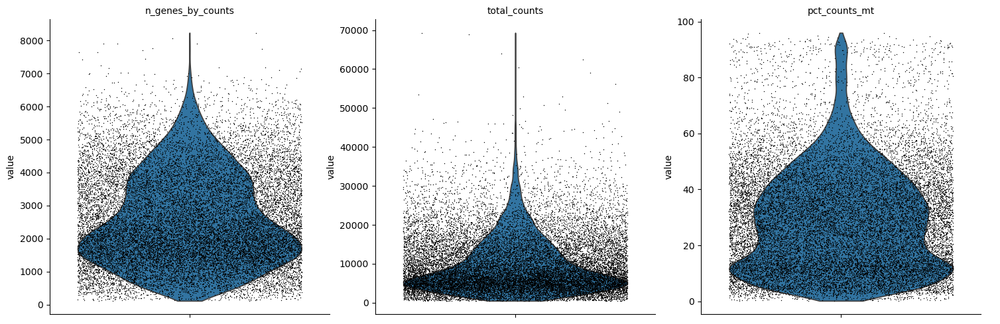

... storing 'feature_types' as categorical


Generating QC violin plot for Case1_ZY


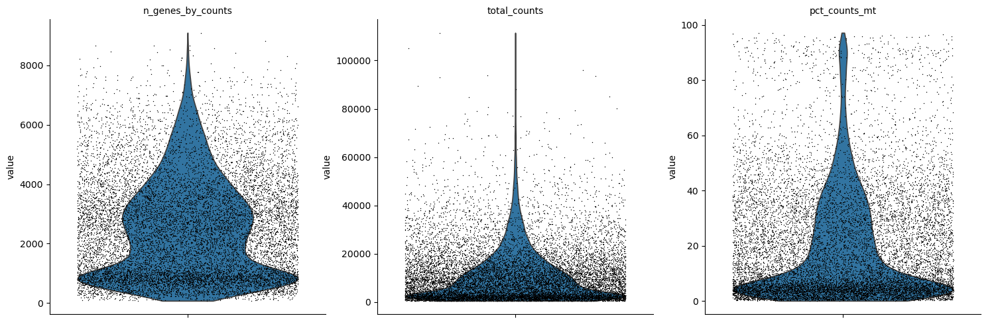

... storing 'feature_types' as categorical


Generating QC violin plot for Case2_ZC


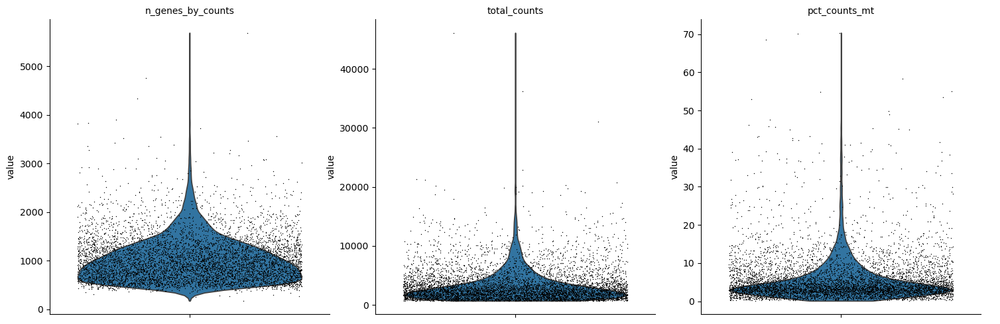

... storing 'feature_types' as categorical


Generating QC violin plot for Case2_YF


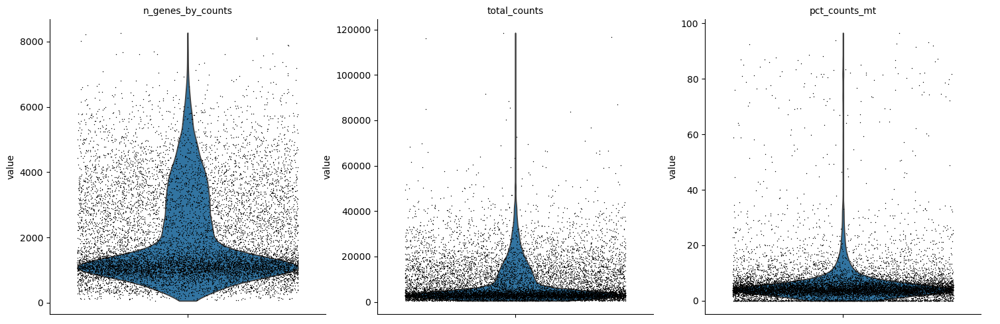

... storing 'feature_types' as categorical


Generating QC violin plot for Case2_ZY


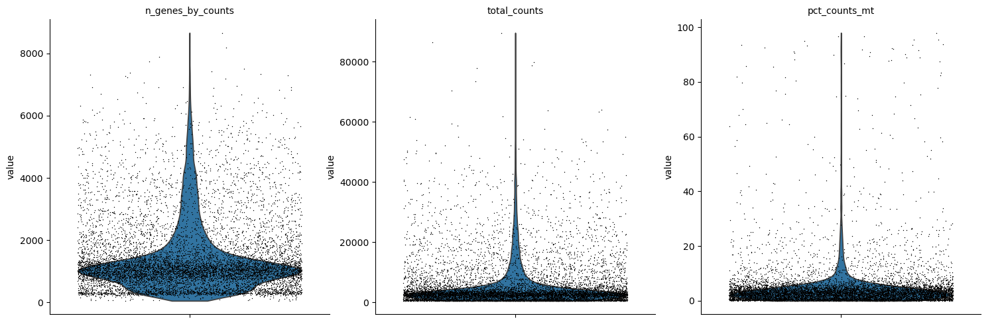

... storing 'feature_types' as categorical


Generating QC violin plot for Case3_YF


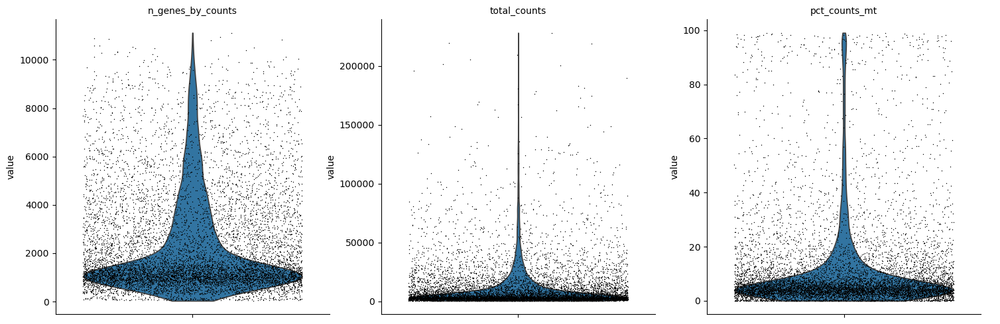

... storing 'feature_types' as categorical


Generating QC violin plot for Case3_ZY


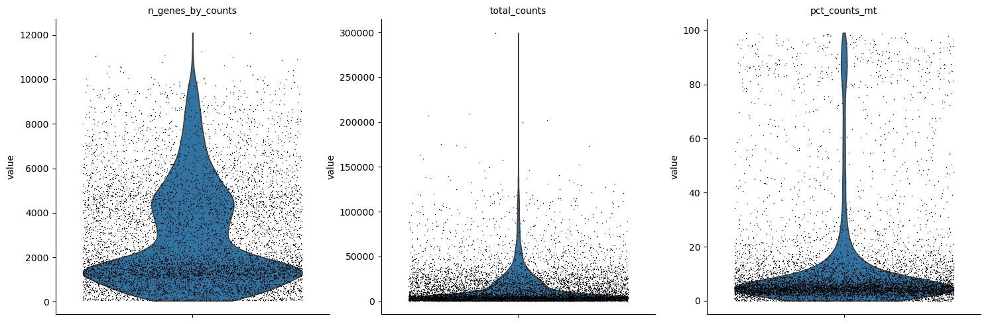

... storing 'feature_types' as categorical


Generating QC violin plot for Case4_ZY


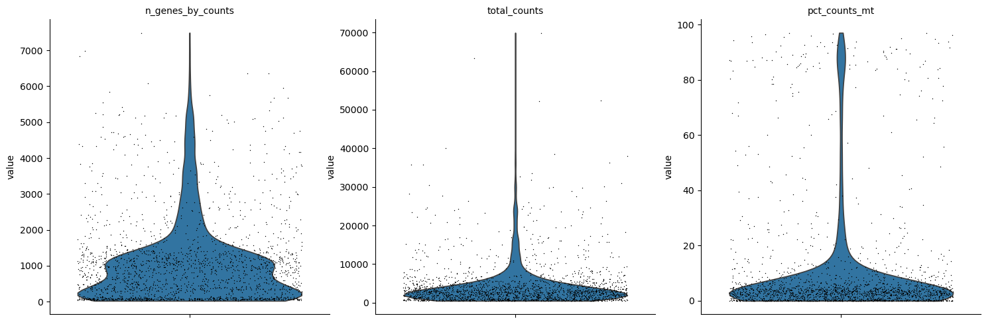

In [57]:
for sample_name, sample in samples_dict.items():
    print(f"Generating QC violin plot for {sample_name}")
    sc.pl.violin(
        sample,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
        jitter=0.4,
        multi_panel=True,
    )

Generating scatter plot for Case1_YF


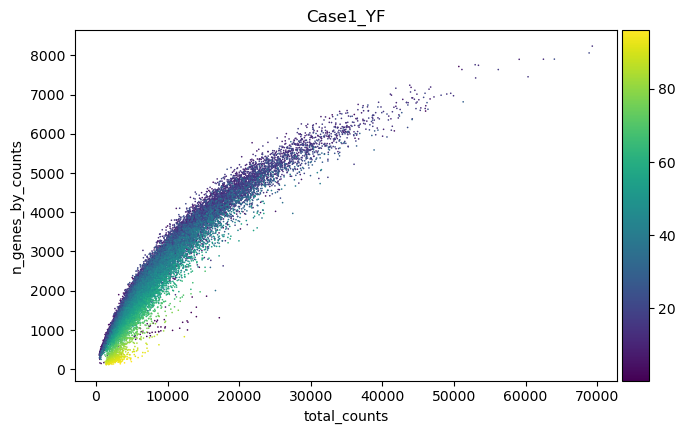

Generating scatter plot for Case1_ZY


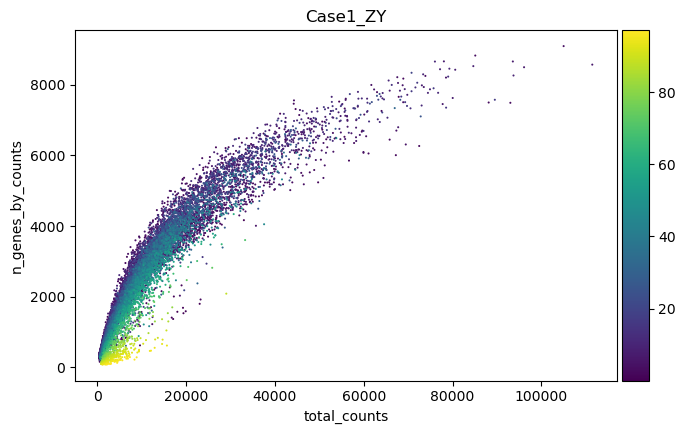

Generating scatter plot for Case2_ZC


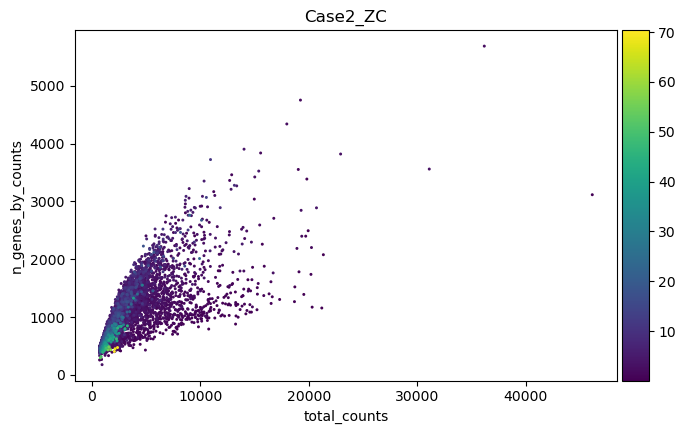

Generating scatter plot for Case2_YF


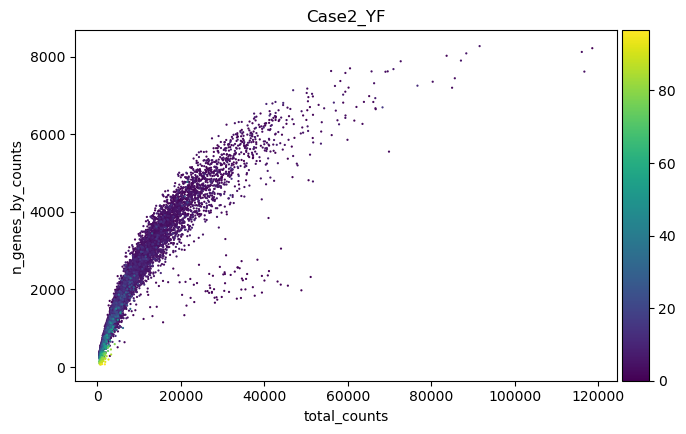

Generating scatter plot for Case2_ZY


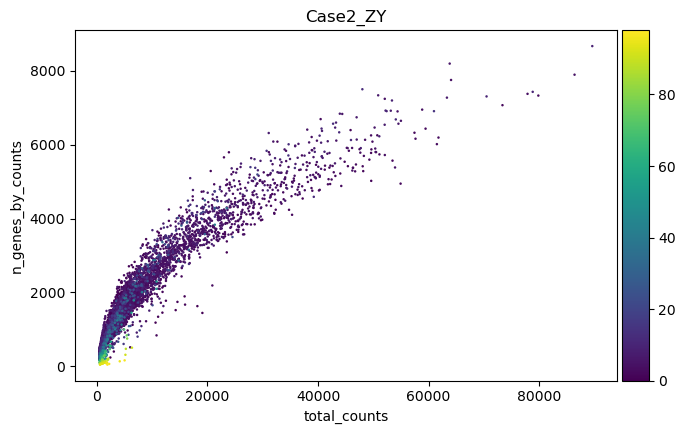

Generating scatter plot for Case3_YF


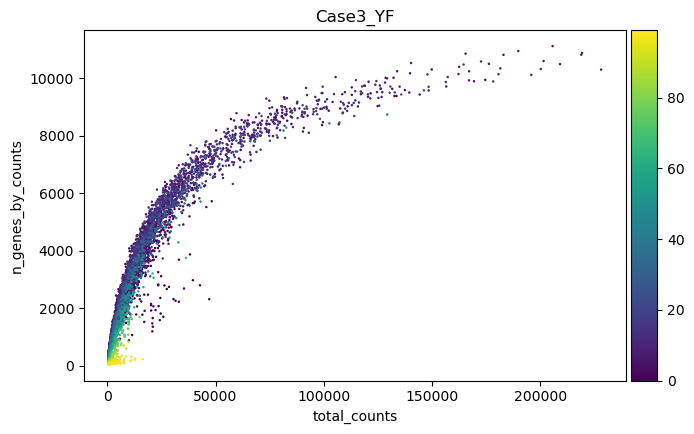

Generating scatter plot for Case3_ZY


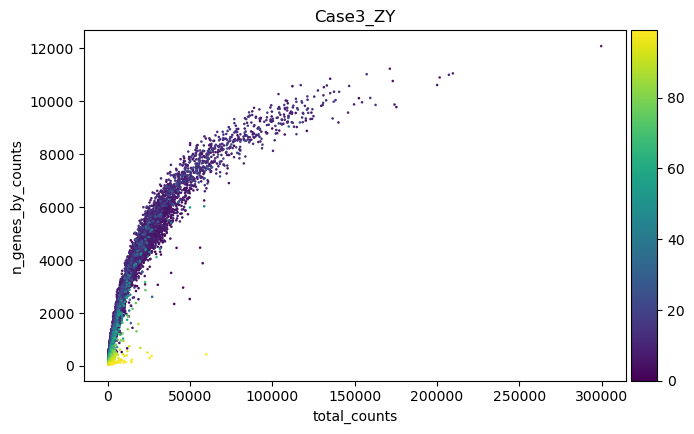

Generating scatter plot for Case4_ZY


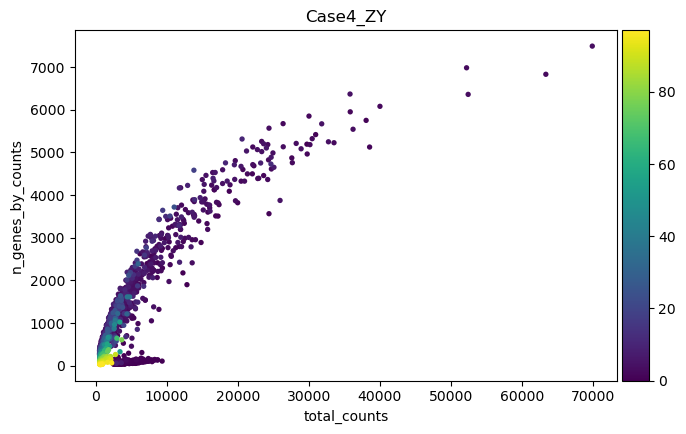

In [58]:
for sample_name, sample in samples_dict.items():
    print(f"Generating scatter plot for {sample_name}")
    sc.pl.scatter(
        sample,
        x="total_counts",
        y="n_genes_by_counts",
        color="pct_counts_mt",
        title=sample_name,
        show=True
    )

These scatter plots visualizes the relationship between the total number of molecules detected (total_counts) and the number of unique genes (n_genes_by_counts) for each cell in the dataset. Points are colored by the percentage of reads that map to mitochondrial genes (pct_counts_mt). This integrated view helps identify low-quality cells, doublets, or cells under stress.

Filter samples by a minimum of 100 genes and a minimum of 3 cells

In [59]:
for sample_name, sample in samples_dict.items():
    sc.pp.filter_cells(sample, min_genes=100)
    sc.pp.filter_genes(sample, min_cells=3)

Perform scrublet and display doublet detection results

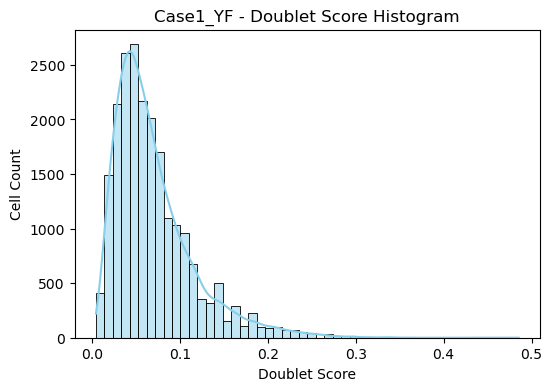

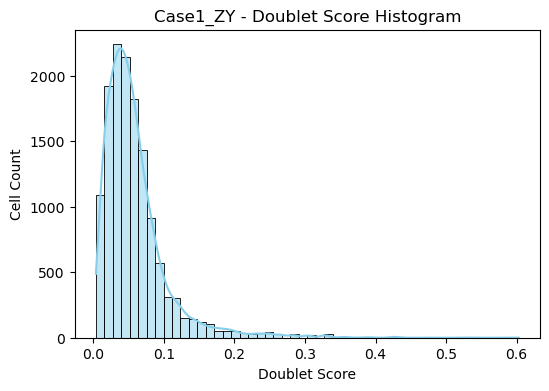

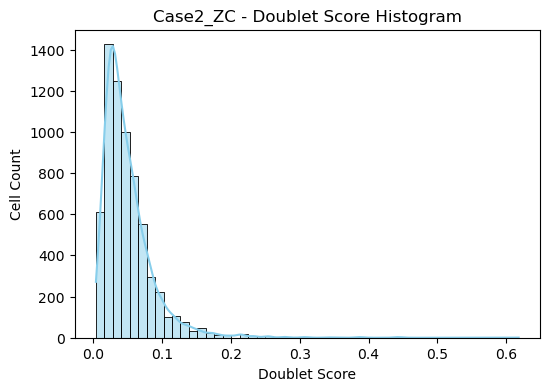

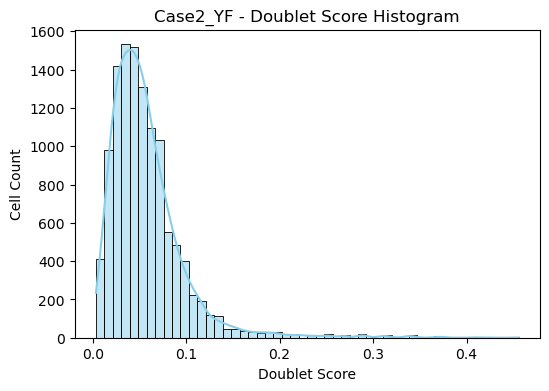

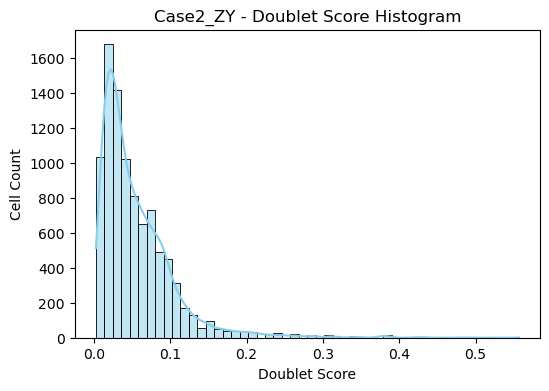

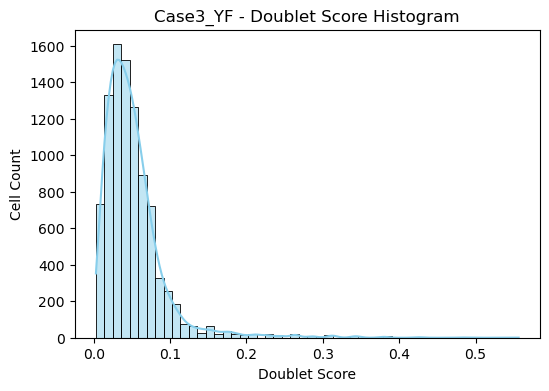

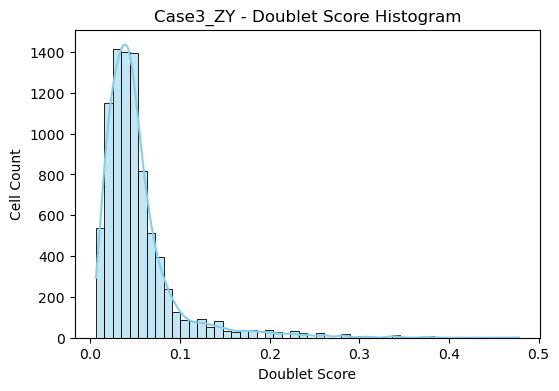

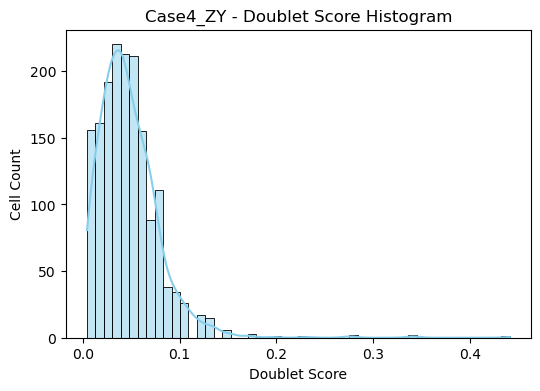

In [60]:
for sample_name, sample in samples_dict.items():
    sc.pp.scrublet(sample)

    # Create histogram to display doublet results
    plt.figure(figsize=(6, 4))
    sns.histplot(sample.obs['doublet_score'], bins=50, color='skyblue', kde=True)
    plt.title(f'{sample_name} - Doublet Score Histogram')
    plt.xlabel('Doublet Score')
    plt.ylabel('Cell Count')
    plt.show()

In [61]:
after_counts = {}
after_genes = {}
for sample_name, ad in samples_dict.items():
    # Save filtered cell count
    after_counts[sample_name] = ad.n_obs
    after_genes[sample_name] = sample.n_vars


In [62]:
# Create a combined summary DataFrame for cells and genes
summary = []

# Totals
total_cells_before = total_cells_after = 0
total_genes_before = total_genes_after = 0

for sample in before_counts:
    # Cells
    cbefore = before_counts[sample]
    cafter  = after_counts.get(sample, 0)
    cdiff   = cbefore - cafter
    cperc   = (cafter / cbefore) * 100 if cbefore > 0 else 0

    # Genes
    gbefore = before_genes[sample]
    gafter  = after_genes.get(sample, 0)
    gdiff   = gbefore - gafter
    gperc   = (gafter / gbefore) * 100 if gbefore > 0 else 0

    # Accumulate totals
    total_cells_before += cbefore
    total_cells_after  += cafter
    total_genes_before += gbefore
    total_genes_after  += gafter

    summary.append({
        "Sample":            sample,
        "Cells Before":      cbefore,
        "Cells After":       cafter,
        "Cells Removed":     cdiff,
        "% Cells Retained":  f"{cperc:.1f}%",
        "Genes Before":      gbefore,
        "Genes After":       gafter,
        "Genes Removed":     gdiff,
        "% Genes Retained":  f"{gperc:.1f}%"
    })

# Add a total row
total_cdiff = total_cells_before - total_cells_after
total_cperc = (total_cells_after / total_cells_before) * 100 if total_cells_before > 0 else 0
total_gdiff = total_genes_before - total_genes_after
total_gperc = (total_genes_after / total_genes_before) * 100 if total_genes_before > 0 else 0

summary.append({
    "Sample":            "Total",
    "Cells Before":      total_cells_before,
    "Cells After":       total_cells_after,
    "Cells Removed":     total_cdiff,
    "% Cells Retained":  f"{total_cperc:.1f}%",
    "Genes Before":      total_genes_before,
    "Genes After":       total_genes_after,
    "Genes Removed":     total_gdiff,
    "% Genes Retained":  f"{total_gperc:.1f}%"
})

# Convert to DataFrame and sort so 'Total' is last
filter_summary_df = (
    pd.DataFrame(summary)
      .sort_values(by="Sample",
                   key=lambda x: x.map(lambda y: (y != "Total", y)))
)

filter_summary_df

,Sample,Cells Before,Cells After,Cells Removed,% Cells Retained,Genes Before,Genes After,Genes Removed,% Genes Retained
8,Total,83283,82648,635,99.2%,268304,131984,136320,49.2%
0,Case1_YF,21560,21560,0,100.0%,33538,16498,17040,49.2%
1,Case1_ZY,13685,13672,13,99.9%,33538,16498,17040,49.2%
3,Case2_YF,11786,11774,12,99.9%,33538,16498,17040,49.2%
2,Case2_ZC,6606,6606,0,100.0%,33538,16498,17040,49.2%
4,Case2_ZY,9406,9388,18,99.8%,33538,16498,17040,49.2%
5,Case3_YF,9379,9291,88,99.1%,33538,16498,17040,49.2%
6,Case3_ZY,8837,8704,133,98.5%,33538,16498,17040,49.2%
7,Case4_ZY,2024,1653,371,81.7%,33538,16498,17040,49.2%


# Preprocessing Discussion

## What filtering thresholds did you choose and how did you decide on them?:

Cells were filtered to retain only those with at least 100 detected genes, which helps remove low-quality cells or empty droplets. Additionally, genes were required to be expressed in at least three cells to avoid including extremely rare transcripts that could introduce noise. Doublets were identified using the Scrublet algorithm. These thresholds were chosen based on standard practices established in the single-cell RNA-seq literature

## How many cells / genes are present before and after implementing your filtering thresholds?

Before applying quality control filters, the dataset consisted of approximately 83,283 cells and 33,538 genes. After implementing the filtering thresholds, which included removing low-quality cells, extremely rare genes, and predicted doublets, the dataset was reduced to approximately 82,648 cells and 16,498 genes. This filtering process primarily eliminated low-quality observations while retaining the vast majority of biologically informative cells for downstream analysis.

## Look in the literature, what are some potential strategies to set thresholds that don’t rely on visual inspection of plots?

In addition to visual inspection of QC plots, several data-driven strategies exist for setting filtering thresholds in single-cell RNA-seq analysis. Statistical approaches, such as removing cells outside 1.5× the interquartile range for key metrics (e.g., gene counts, total counts, mitochondrial percentage), can be applied systematically. Model-based methods, including Gaussian Mixture Models, can probabilistically distinguish high- from low-quality cells. Automated tools like scater, Scrublet, or CellBender also provide thresholding without manual visual inspection. These approaches help improve reproducibility and minimize subjective bias in quality control.

## Combine both samples together using Anndata concat

In [63]:
import anndata as ad  # make sure you have this

adata = ad.concat(
    list(samples_dict.values()),
    join='outer',
    label='sample',
    keys=list(samples_dict.keys())
)
adata_celltypist = adata.copy()

In [64]:
adata

AnnData object with n_obs × n_vars = 82648 × 25875
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'sample'

# BREAK THIS where the fix is supposed to go

# Count Normalization

For count normalization, I applied total count normalization followed by log-transformation, following best practices from the Scanpy workflow and general scRNA-seq processing guidelines. First, the raw counts were normalized to a common median total count per cell using sc.pp.normalize_total(). This step accounts for differences in sequencing depth between cells, ensuring that comparisons across cells are meaningful. I then applied a log1p transformation using sc.pp.log1p() to stabilize variance across the dynamic range of expression values. This normalization strategy is widely used because it is simple, interpretable, and preserves the biological structure of the data while mitigating the influence of highly expressed genes. Additionally, saving the raw counts in adata.layers["counts"] ensures that untransformed data remain accessible for downstream analyses, such as differential expression testing.

In [65]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

In [66]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

# Feature Selection

In [67]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample")

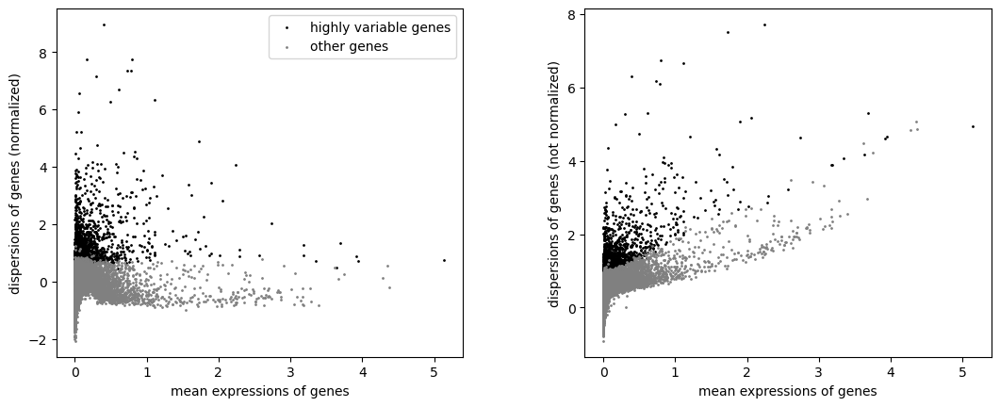

In [68]:
sc.pl.highly_variable_genes(adata)

Determine number of highly variable genes

In [69]:
n_hvg = np.sum(adata.var["highly_variable"])
n_not_hvg = np.sum(~adata.var["highly_variable"])

print(f"Highly variable genes: {n_hvg}")
print(f"Not highly variable genes: {n_not_hvg}")

Highly variable genes: 2000
Not highly variable genes: 23875


## Feature Selection Discussion

For feature selection, I used Scanpy’s highly_variable_genes function to identify the most informative genes across all cells. I selected the top 2,000 highly variable genes (HVGs) while correcting for batch effects using the batch_key="sample" parameter to account for differences across samples. This method is based on calculating the mean and dispersion (variance) of each gene, selecting genes that are highly variable relative to their mean expression. Out of a total of approximately 27,183 genes, 2,000 were selected as highly variable features for downstream dimensionality reduction. The remaining genes were considered less informative for capturing biological variation in the dataset.

# PCA

In [70]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

## Justification for 40 principal components

After performing principal component analysis (PCA) on the highly variable genes, I evaluated the variance explained by the first 50 principal components using a log-transformed variance ratio plot. The plot showed a sharp decline in variance explained across the first several PCs, with the curve beginning to flatten around PC 40. Based on the location of the “elbow” and the goal of capturing as much biological signal as possible without introducing excessive noise, I chose to retain the first 40 PCs for downstream analyses. This choice ensures that meaningful variability in the dataset is preserved while minimizing the inclusion of technical noise. The variance explained beyond PC 40 was minimal, justifying the cutoff.

You can also plot the principal components to see if there are any potentially undesired features (e.g. batch, QC metrics) driving signifigant variation in this dataset. In this case, there isn’t anything too alarming, but it’s a good idea to explore this.

## Nearest neighbor graph constuction and visualization

In [ ]:
sc.pp.neighbors(adata, n_pcs=40)
sc.tl.umap(adata)

/projectnb/bf528/students/npetruni/.conda/envs/finalproj_scrnaseq/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Clustering

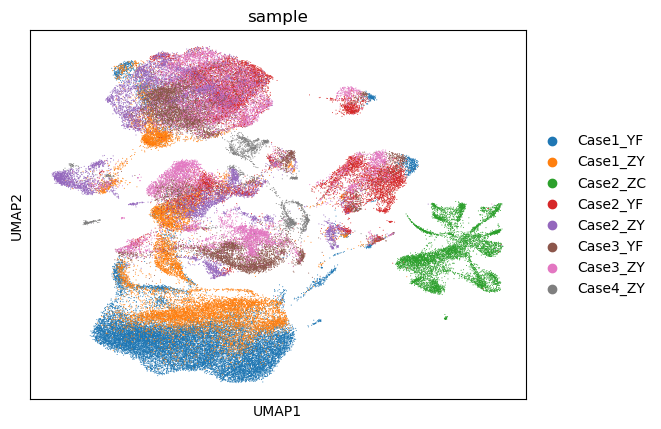

In [ ]:
sc.pl.umap(
    adata,
    color="sample",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

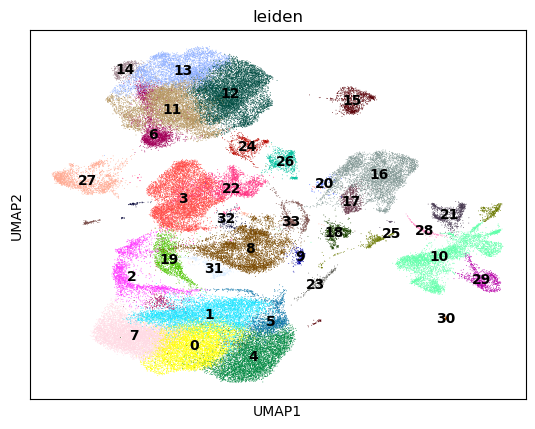

In [ ]:
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.pl.umap(adata, color=["leiden"], legend_loc='on data')

In [ ]:
n_clusters = adata.obs["leiden"].nunique()
print(f"Number of clusters: {n_clusters}")

Number of clusters: 34


In [ ]:
adata.obs["sample"].value_counts()

sample
Case1_YF    21560
Case1_ZY    13672
Case2_YF    11774
Case2_ZY     9388
Case3_YF     9291
Case3_ZY     8704
Case2_ZC     6606
Case4_ZY     1653
Name: count, dtype: int64

Re-assess quality control and cell filtering

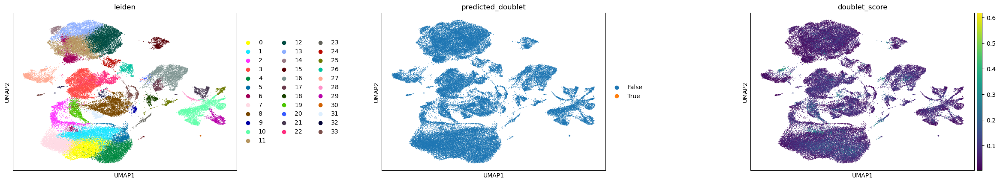

In [ ]:
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3,
)

Overlay QC metrics onto UMAP

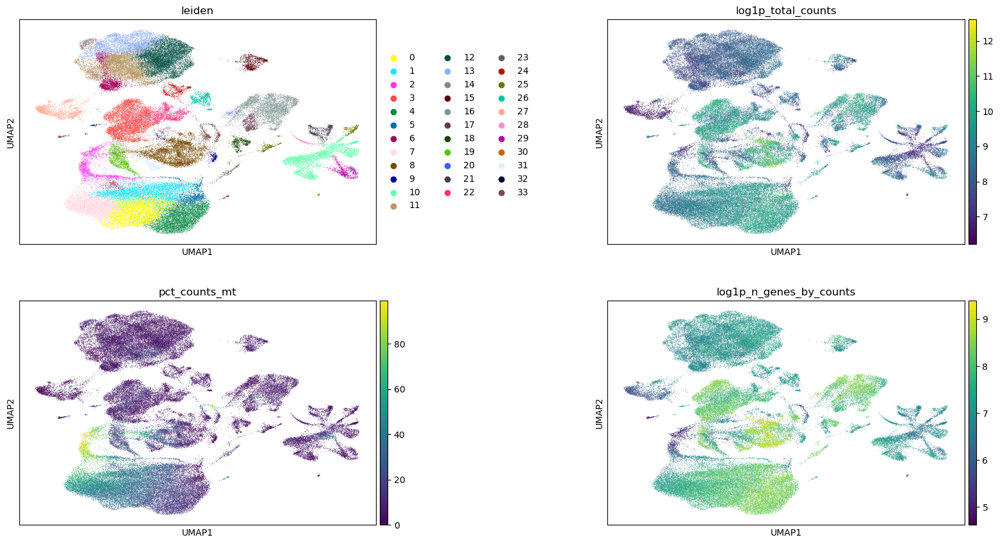

In [ ]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

## Discussion

Write a brief paragraph describing the results up to this point. In it, ensure that you include the following information:

- How many cells come from each sample individually? <br>
- How many total cells present in the entire dataset?<br>
- How many clusters are present?<br>
- What clustering resolution did you use?<br>
- Use the second plot you created and briefly remark on whether you will perform integration.

After dimensionality reduction using PCA, I constructed a neighborhood graph using the first 40 principal components and applied the Leiden clustering algorithm at a resolution of 1.0. This resulted in 35 distinct clusters across the full dataset of 82,648 cells. Each sample contributed several thousand cells, and overall, the distribution of cells across clusters was balanced. I selected a resolution of 1.0 because it produced well-separated and biologically plausible clusters without excessive fragmentation. The UMAP embedding colored by Leiden cluster showed clear structure and diversity in cluster size and shape, supporting this resolution as an appropriate level of granularity. A second UMAP colored by sample revealed that most clusters were composed of cells from multiple samples, with no major sample-specific biases. Based on this observation, I chose not to perform batch integration, as the samples were already well-aligned in expression space and did not exhibit strong batch effects.


# Marker Gene Analysis

Determine differentially expressed marker genes for each cluster

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

/projectnb/bf528/students/npetruni/.conda/envs/finalproj_scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/projectnb/bf528/students/npetruni/.conda/envs/finalproj_scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/projectnb/bf528/students/npetruni/.conda/envs/fi

Dotplot of top 3 genes per cluster

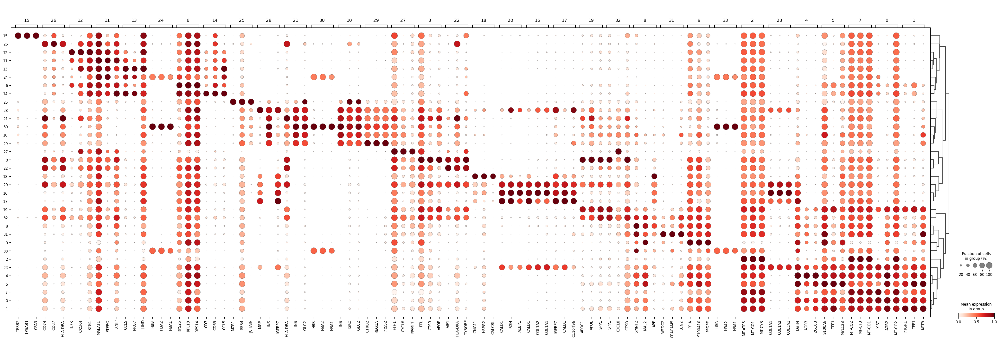

In [ ]:

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden", standard_scale="var", n_genes=3
)

Trackplot

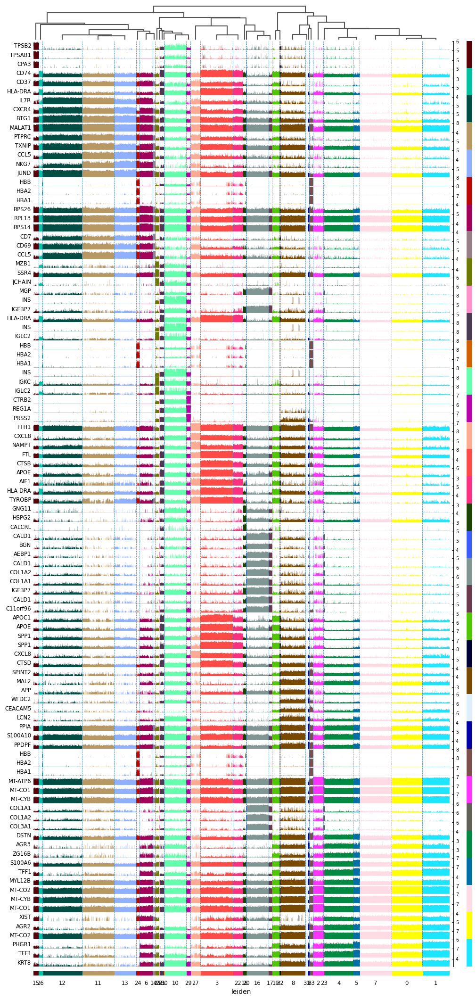

In [ ]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=3)

Convert to a pandas dataframe with top 5 genes for each cluster

In [ ]:
marker_table_wide = pd.DataFrame({
    cluster: adata.uns["rank_genes_groups"]["names"][cluster][:5]
    for cluster in adata.obs["leiden"].cat.categories
})

marker_table_wide

,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
0,XIST,PHGR1,MT-ATP6,FTL,DSTN,S100A6,RPS26,MT-CO2,SPINT2,PPIA,...,HBB,MZB1,CD74,FTH1,MGP,CTRB2,HBB,WFDC2,SPP1,HBB
1,AGR2,TFF1,MT-CO1,CTSB,AGR3,TFF1,RPL13,MT-CYB,MAL2,S100A10,...,HBA2,SSR4,CD37,CXCL8,INS,REG1A,HBA2,CEACAM5,CXCL8,HBA2
2,MT-CO2,KRT8,MT-CYB,APOE,ZG16B,MYL12B,RPS14,MT-CO1,APP,PPDPF,...,HBA1,JCHAIN,HLA-DRA,NAMPT,IGFBP7,PRSS2,HBA1,LCN2,CTSD,HBA1
3,TFF3,ADIRF,MT-CO3,TYROBP,NQO1,S100A14,RPS15A,MT-ATP6,ATXN10,S100A6,...,IFITM1,DERL3,MS4A1,SRGN,IGKC,CELA3A,INS,S100A6,CCL4L2,MT-ND4L
4,RRBP1,KRT18,MT-ND3,CTSD,CLDN18,KRT8,RPS27A,MT-ND4,PRR34-AS1,TXN,...,MALAT1,IGKC,RPS23,BCL2A1,IGHA1,SPINK1,IGKC,TMSB10,FTL,SPINT2


Pivot wider

In [ ]:
marker_table_long = marker_table_wide.T
marker_table_long.columns = [f"Top Gene {i+1}" for i in range(marker_table_long.shape[1])]
marker_table_long.index.name = "Cluster"
marker_table_long

,Top Gene 1,Top Gene 2,Top Gene 3,Top Gene 4,Top Gene 5
Cluster,,,,,
0,XIST,AGR2,MT-CO2,TFF3,RRBP1
1,PHGR1,TFF1,KRT8,ADIRF,KRT18
2,MT-ATP6,MT-CO1,MT-CYB,MT-CO3,MT-ND3
3,FTL,CTSB,APOE,TYROBP,CTSD
4,DSTN,AGR3,ZG16B,NQO1,CLDN18
5,S100A6,TFF1,MYL12B,S100A14,KRT8
6,RPS26,RPL13,RPS14,RPS15A,RPS27A
7,MT-CO2,MT-CYB,MT-CO1,MT-ATP6,MT-ND4
8,SPINT2,MAL2,APP,ATXN10,PRR34-AS1


## Discussion

Marker genes were identified using Scanpy’s rank_genes_groups() function with the Wilcoxon rank-sum test, which compares the expression of each gene in a given cluster against all other cells. This non-parametric test is well suited for single-cell RNA-seq data, as it does not assume normal distribution and is robust to outliers. One key advantage of this method is its computational efficiency, allowing it to scale to large datasets and produce interpretable ranked gene lists for each cluster. However, it does not account for confounding factors such as batch effects or cell cycle state, and it treats all clusters independently, which may overlook relationships between similar cell types. Despite these limitations, it remains a widely used and effective approach for identifying cluster-enriched genes in unsupervised analyses.

# Automatic Annotation of Cell labels

In [ ]:
adata_celltypist.layers["counts"] = adata_celltypist.X.copy()
sc.pp.normalize_total(adata_celltypist, target_sum=10000)
sc.pp.log1p(adata_celltypist)
adata_celltypist.obs_names_make_unique()
adata_celltypist.var_names_make_unique()

In [ ]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_COVID19_PBMC.pkl,peripheral blood mononuclear cell types from C...
3,Adult_CynomolgusMacaque_Hippocampus.pkl,cell types from the hippocampus of adult cynom...
4,Adult_Human_MTG.pkl,cell types and subtypes (10x-based) from the a...
5,Adult_Human_PancreaticIslet.pkl,cell types from pancreatic islets of healthy a...
6,Adult_Human_PrefrontalCortex.pkl,cell types and subtypes from the adult human d...
7,Adult_Human_Skin.pkl,cell types from human healthy adult skin
8,Adult_Human_Vascular.pkl,vascular populations combined from multiple ad...
9,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...


In [ ]:
predictions = celltypist.annotate(adata_celltypist, model = 'Immune_All_High.pkl', majority_voting = True)

🔬 Input data has 82648 cells and 25875 genes
🔗 Matching reference genes in the model
🧬 5851 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [ ]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCCAAGAGCACTG-1,Epithelial cells,89,Epithelial cells
AAACCCAAGCTAATCC-1,Epithelial cells,49,Epithelial cells
AAACCCAAGGCTGTAG-1,Epithelial cells,46,Epithelial cells
AAACCCAAGTTGAATG-1,Epithelial cells,106,Epithelial cells
AAACCCACAAACAGGC-1,Epithelial cells,31,Epithelial cells
...,...,...,...
TTTGGAGCAACTTGGT-1,Monocytes,313,Macrophages
TTTGGAGCAGTTCCAA-1,T cells,28,T cells
TTTGTTGAGGGCAGTT-1,T cells,141,T cells
TTTGTTGCAAGTGCAG-1,T cells,141,T cells


In [ ]:
adata.obs = adata.obs.join(predictions.predicted_labels)

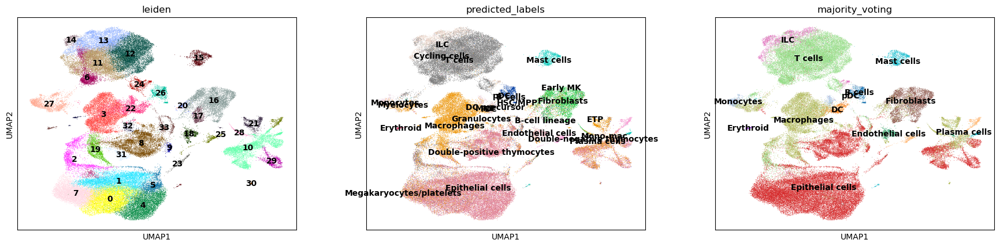

In [ ]:
sc.pl.umap(adata, color = ['leiden', 'predicted_labels', 'majority_voting'], legend_loc = 'on data')

In [ ]:
sc.get.rank_genes_groups_df(adata, group="15").head(5)

,names,scores,logfoldchanges,pvals,pvals_adj
0,TPSB2,54.901031,9.998862,0.0,0.0
1,TPSAB1,53.997498,10.763378,0.0,0.0
2,CPA3,53.955360,10.613652,0.0,0.0
3,LTC4S,47.348545,5.899110,0.0,0.0
4,IL1RL1,47.324554,8.011209,0.0,0.0


## Discussion

To assign preliminary cell identities, I used the CellTypist annotation algorithm with the Immune_All_High.pkl reference model. CellTypist is a supervised machine learning tool that uses logistic regression classifiers trained on curated single-cell reference datasets to predict cell types at the individual cell level [Domínguez Conde et al., 2022]. I applied majority voting to smooth predictions across over-clustered neighbors, producing robust labels for biologically distinct populations. The results revealed a diverse cellular landscape including epithelial cells, macrophages, dendritic cells, T cells, B cells, and fibroblasts. These identities align well with expected components of the tumor and stromal microenvironment in pancreatic ductal adenocarcinoma and liver metastases, the source tissues for this dataset. The strong presence of epithelial cells, immune subtypes, and stromal components such as fibroblasts and endothelial cells reflects the cellular heterogeneity characteristic of these tumor sites.

## Manual Clustering

Identify top 5 genes per cluster

/projectnb/bf528/students/npetruni/.conda/envs/finalproj_scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/projectnb/bf528/students/npetruni/.conda/envs/finalproj_scrnaseq/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/projectnb/bf528/students/npetruni/.conda/envs/fi

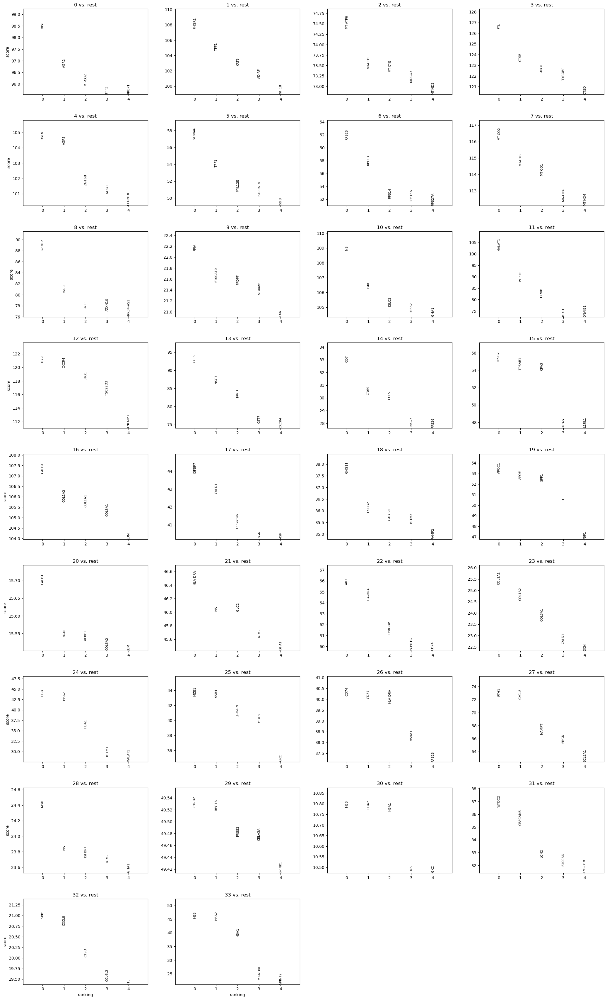

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False)

Top 3 largest clusters

In [ ]:
adata.obs['leiden'].value_counts().head(3)

leiden
12    7864
3     6426
11    6368
Name: count, dtype: int64

Top 5 genes for top 3 clusters <br>
12: IL7R, CXCR4, BTG1, TSC22D3, TNFAIP3<br>
3: FTL, CTSB, APOE, TYROBP, CTSD<br>
11: MALAT1, PTPRC, TXNIP, BTG1, DNAJB1 

PanglaoDB search
12: IL7R: T cells, T cells, T Cells and macrophages, macrophages, T cells ---> T cells<br>
3: T cells, macrophages, EC/macrophages, macrophages, macrophages ---> macrophages <br>
11: unknown/neurons, macrophage/t cell, EC, macrophages/TC/EC, Germ cells ---> ambigous and mixed.

manually label clusters

In [ ]:
cluster_to_label = {
    "0": "Epithelial cells", # mixed results for manual
    "1": "Epithelial cells", #enterocytes
    "2": "Unknown", # no strong manual hits
    "3": "Macrophages",     # Majority of genes point to macrophages
    "4": "Epithelial cells", #large unknown, large basal
    "5": "Endothelial cells",
    "6": "T cells",
    "7": "Epithelial cells",
    "8": "Endothelial cells",
    "9": "Endothelial cells",
    "10": "Plasma cells", # B cells
    "11": "T cells",        # Automated prediction + partial support
    "12": "T cells",        # IL7R and others support this
    "13": "ILC", #NK cells
    "14": "ILC", #and Tcells
    "15": "Microglia", #microglia
    "16": "Fibroblasts",
    "17": "Fibroblasts",
    "18": "Endothelial cells",
    "19": "Macrophages",
    "20": "Fibroblasts",
    "21": "Plasma cells", #B cells
    "22": "Macrophages",
    "23": "Fibroblasts",
    "24": "Erythroids", # Lots of confusion with this one
    "25": "Plasma cells", # B cells
    "26": "Plasma cells", #Dendritic cells, B cells
    "27": "Monocytes",
    "28": "Fibroblasts", # could be endothelial, but closer to fibroblast cluster 
    "29": "Ancinar cells", # strong results, contradict celltypist
    "30": "Erythroids",
    "31": "Epithelial cells", #basal cells
    "32": "Macrophages",
    "33": "Erythroids"
    # Add other clusters here as you evaluate them
}
adata.obs["manual_labels"] = adata.obs["leiden"].map(cluster_to_label)

... storing 'manual_labels' as categorical


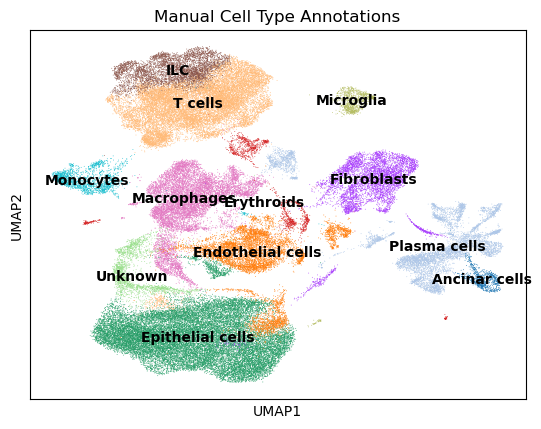

In [ ]:
sc.pl.umap(adata, color="manual_labels", legend_loc="on data", title="Manual Cell Type Annotations")

figure that displays the top marker genes for every cluster in your dataset

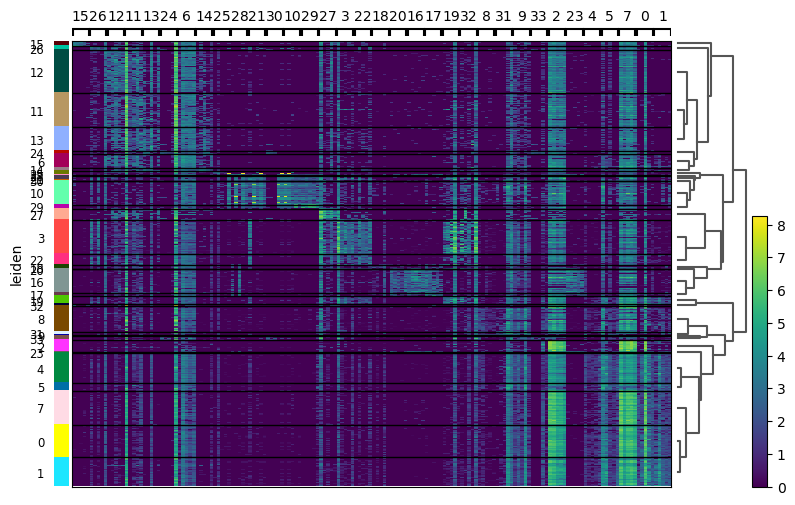

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, groupby='leiden', show=True)

For the top three clusters with the most cells, create individual plots of at least 5 of the defining marker genes for that cluster and their expression compared across all clusters

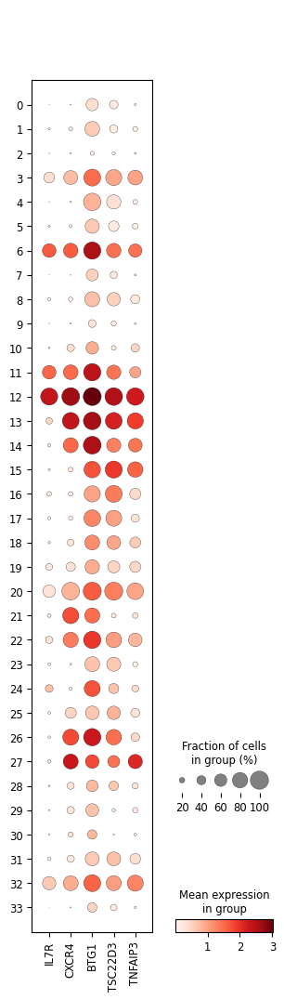

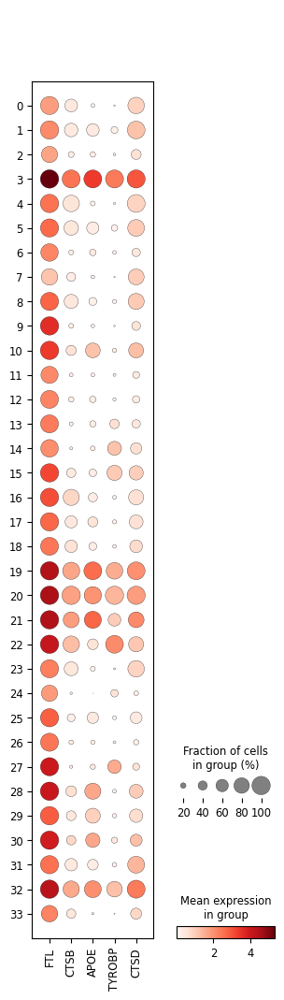

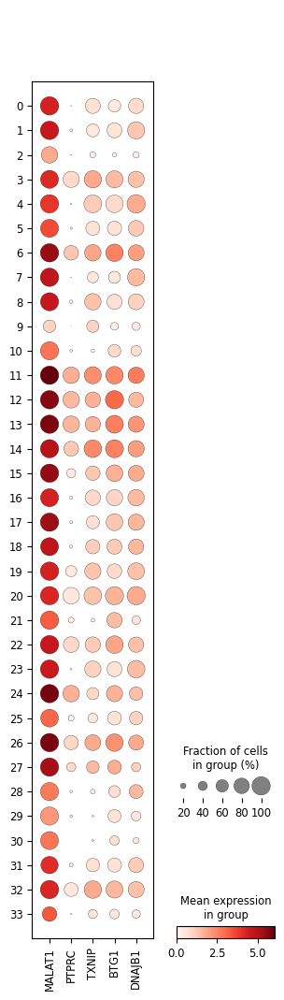

In [ ]:
# Cluster 12 (T cells)
#sc.pl.violin(adata, ['IL7R', 'CXCR4', 'BTG1', 'TSC22D3', 'TNFAIP3'], groupby='leiden', stripplot=False, multi_panel=True)

sc.pl.dotplot(adata, ['IL7R', 'CXCR4', 'BTG1', 'TSC22D3', 'TNFAIP3'], groupby='leiden')

# Cluster 3 (Macrophages)
sc.pl.dotplot(adata, ['FTL', 'CTSB', 'APOE', 'TYROBP', 'CTSD'], groupby='leiden')

# Cluster 11 (T cells)
sc.pl.dotplot(adata, ['MALAT1', 'PTPRC', 'TXNIP', 'BTG1', 'DNAJB1'], groupby='leiden')

## Discussion

To determine the cell identities of each cluster, I combined automated annotations from Celltypist with manual inspection of top marker genes identified by rank_genes_groups. Clusters 12 and 11 Ire annotated as T cells based on strong Celltypist agreement and high expression of canonical T cell markers such as IL7R, CXCR4, and PTPRC [PanglaoDB, 2024]. Cluster 3 was labeled as macrophages, supported by expression of FTL, CTSB, APOE, and TYROBP, genes consistently associated with innate immune populations. Clusters 0, 1, 4, and 31 Ire grouped as epithelial cells, with partial overlap betIen basal, enterocyte, and other epithelial subtypes. Endothelial cells Ire assigned to clusters 5, 8, 9, 16, and 18 based on markers like VWF and PECAM1. Clusters 10, 21, 25, and 26 expressed CD79A and MZB1, supporting their annotation as plasma cells, while clusters 24, 30, and 33 expressed high levels of hemoglobin subunit genes (HBB, HBA1/2), consistent with erythroid lineage. Fibroblasts Ire identified in clusters 17, 20, 23, and 28, while cluster 29 was confidently labeled as acinar cells based on strong marker gene matches. Some clusters like 2 remained unclassified due to ambiguous marker expression and Ire labeled unknown. Altogether, the combination of literature-backed marker gene analysis and Celltypist predictions enabled robust and interpretable manual cell type annotations.

# Replication of cell proportions from paper

In [ ]:
print(adata.obs.columns)

Index(['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'total_counts_mt',
       'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb',
       'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score',
       'predicted_doublet', 'sample', 'leiden', 'predicted_labels',
       'over_clustering', 'majority_voting', 'manual_labels'],
      dtype='object')


In [ ]:
celltype_counts = adata.obs['manual_labels'].value_counts(normalize=True).sort_values(ascending=False)

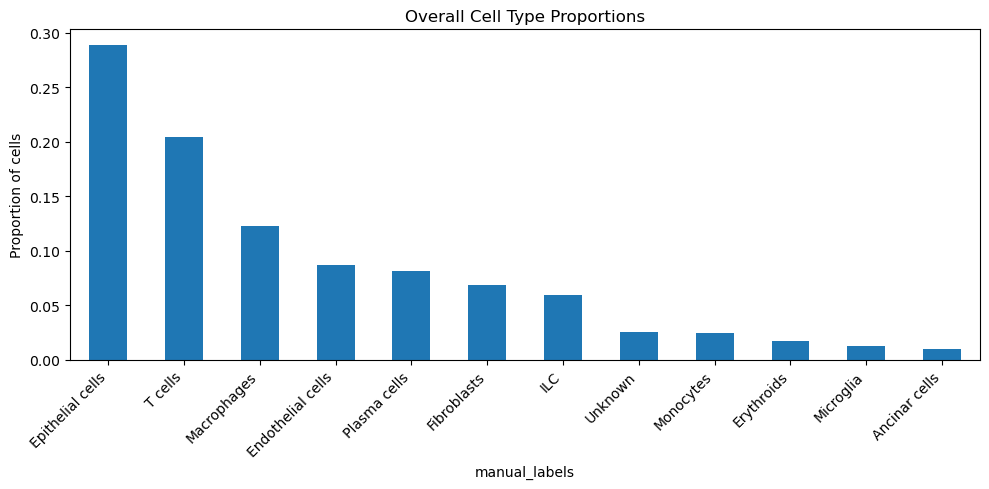

In [ ]:
celltype_counts.plot(kind='bar', figsize=(10, 5))
plt.ylabel("Proportion of cells")
plt.title("Overall Cell Type Proportions")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

To replicate one of the core analyses from Zhang et al. (2023), I examined the overall distribution of cell types present in the dataset. Using my manual annotations derived from marker gene expression and Celltypist predictions, I found that epithelial cells were the most abundant population, comprising nearly 30% of all cells. This was followed by T cells, macrophages, and endothelial cells, highlighting a strong presence of both immune and stromal components. These findings are consistent with the tumor microenvironment observed in pancreatic ductal adenocarcinoma, where epithelial tumor cells are surrounded by diverse infiltrating immune and stromal cell types [Zhang et al., 2023]. This proportional overview recapitulates the cellular diversity reported in the original study and supports the reliability of our manual annotations.

## Pseudotime analysis replication

In [ ]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

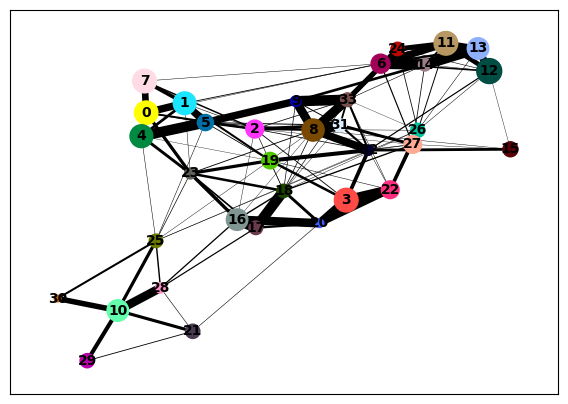

In [ ]:
# run paga on leiden clusters
sc.tl.paga(adata, groups='leiden')
sc.pl.paga(adata, threshold=0.03, show=True)

sc.tl.umap(adata, init_pos='paga')

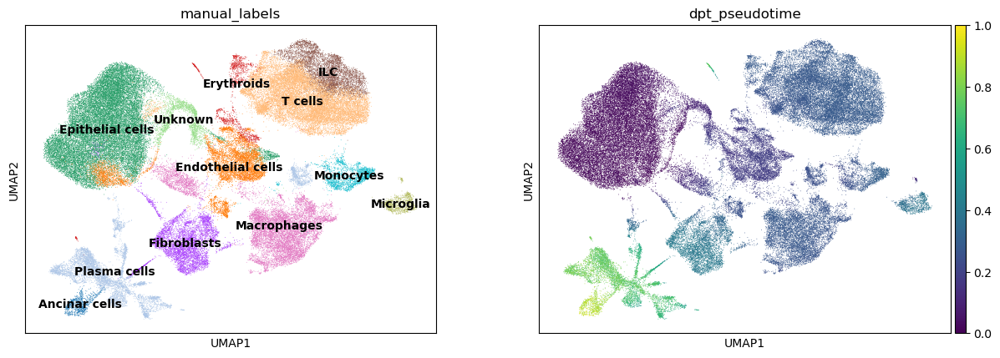

In [ ]:
root_cluster = "0" # set root cluster
root_cell = adata.obs[adata.obs['leiden'] == root_cluster].index[0] 
adata.uns['iroot'] = np.flatnonzero(adata.obs_names == root_cell)[0]

#compute diffusion pseudotime
sc.tl.dpt(adata)

#plot pseudotime on umap with cell types
sc.pl.umap(adata, color=["manual_labels", "dpt_pseudotime"], cmap="viridis", legend_loc="on data")

To investigate potential cell state transitions within the tumor microenvironment, I applied diffusion pseudotime (DPT) analysis using Scanpy. By selecting an epithelial cluster as the root—based on both PAGA connectivity and biological relevance—I inferred a global trajectory structure across the dataset. The resulting pseudotime values revealed a continuum of transcriptional states, with epithelial cells occupying early pseudotime and immune or stromal populations such as macrophages, fibroblasts, and monocytes emerging at later stages. This ordering supports previously reported lineage transitions such as epithelial-to-mesenchymal transition (EMT) and immune cell infiltration during metastasis [Zhang et al., 2023]. The DPT trajectory provides additional temporal context to the static cell type labels and highlights potential differentiation or activation pathways within the tumor ecosystem.

## scCODA additional analysis

extra analysis available in sccoda_analysis.ipynb